# Project: Diabetes classification Using Machine Learning

* **Axel Stoltz**
* **EFREI | S7 | Machine Learning | DILMI Mohamed Djallel | GHASSANY Mohamad**
* **``Data & AI`` Group**


* October 2024

## Project Overview:

**Dataset:**  

- Diabetes dataset: The dataset consists of various medical predictor variables and a target variable (diabetes outcome: 0 or 1). The features include factors like glucose level, blood pressure, BMI, age, etc.

- You can provide the Pima Indians Diabetes Dataset as a resource or upload a similar dataset from Kaggle (be careful about features names).

## Project Requirements:

## **1. Data Preprocessing:**  

- Analyze the dataset to understand the distribution of classes.

- Handle missing values, if any.

- Encode categorical features appropriately.


In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from ydata_profiling import ProfileReport
import sklearn as sl

In [34]:
df = pd.read_csv('diabetes.csv',delimiter=',')
print(df.head())

   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0            6      148             72             35        0  33.6   
1            1       85             66             29        0  26.6   
2            8      183             64              0        0  23.3   
3            1       89             66             23       94  28.1   
4            0      137             40             35      168  43.1   

   DiabetesPedigreeFunction  Age  Outcome  
0                     0.627   50        1  
1                     0.351   31        0  
2                     0.672   32        1  
3                     0.167   21        0  
4                     2.288   33        1  


In [35]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB
None


**Variables description**
- Pregnancies: Number of times pregnant
- Glucose: Plasma glucose concentration a 2 hours in an oral glucose tolerance test
- BloodPressure: Diastolic blood pressure (mm Hg)
- SkinThickness: Triceps skin fold thickness (mm)
- Insulin: 2-Hour serum insulin (mu U/ml)
- BMI: Body mass index (weight in kg/(height in m)^2)
- DiabetesPedigreeFunction: Diabetes pedigree function
- Age: Age (years)
- Outcome: Class variable (0 or 1)

https://www.kaggle.com/datasets/mathchi/diabetes-data-set

In [36]:
# Generate the profiling report
profile = ProfileReport(df, title="Diabetes Dataset Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Report conclusions: 

**Missing values**
* No missing values 

**Zeros**
* Pregnancies 
* Blood Pressure 
* Skin Thickness 
* Insulin 
* BMI
* Glucose

    ➜ We need to treat variables ```Blood Pressure```, `````Skin Thickness`````, ````Insulin````, ``BMI``, ``Glucose`` as well since it is impossible in real life situation having 0.   
    For e.g : it makes no sense to have 0mm skin thickness. 


### Correlation

* Age and Pregnancies 
* Insulin and Skin thickness

Which seems logical. However I don't have enough medical skills to state if yes or no Insulin and Skin thickness correlations is logical

### Distribution

In [37]:
skew = df.skew().sort_values(ascending=False)
print(skew)

Insulin                     2.272251
DiabetesPedigreeFunction    1.919911
Age                         1.129597
Pregnancies                 0.901674
Outcome                     0.635017
Glucose                     0.173754
SkinThickness               0.109372
BMI                        -0.428982
BloodPressure              -1.843608
dtype: float64


* Insulin                     2.272251 ➜ Right skewed   
* DiabetesPedigreeFunction    1.919911 ➜ Right skewed
* Age                         1.129597 ➜ Right skewed
* Pregnancies                 0.901674 ➜ Right skewed 
* Outcome                     0.635017 ➜ Right skewed 
* Glucose                     0.173754 ➜ Right skewed 
* SkinThickness               0.109372 ➜ Right skewed 
* BMI                        -0.428982 ➜ Left skewed 
* BloodPressure              -1.843608 ➜ Left skewed 

#### Zeros
After some reasearch on internet, I found how to treat/fix zeros and missing values. 

**Step 1 - Ask you if it is normal to have zeros in this varibale.**  

**Step 2 - If no, replace those values by:** 
- The mean if symetrically distributed 
- The median if not 
    *You need also to be sure that the value it computes follows the type of you variable.  
      <span style='background :green' > For e.g, if you var is an INTEGER, be sure to have INTEGER and not a float.*  </span>

**Step 3 - Add a binary flag whenever you replace a value**
  * Replacing a value by the variable mean in one thing but let your model know that you have replaced a value is another. That is why it is important to add binary flag column to your dataset. More information on the youtube video bellow: 
  
  [![YouTube Video Link](http://img.youtube.com/vi/f9AQy7p0QEo/0.jpg)](https://www.youtube.com/watch?v=f9AQy7p0QEo)
  
https://www.quora.com/What-is-the-binary-flag-addition-technique-in-statistics-and-how-is-it-used-in-data-imputation

In [38]:
# Replace all zeros by a NaN
df['BloodPressure'] = df['BloodPressure'].replace(0, pd.NA)
df['SkinThickness'] = df['SkinThickness'].replace(0, pd.NA)
df['Insulin'] = df['Insulin'].replace(0, pd.NA)
df['BMI'] = df['BMI'].replace(0, pd.NA)
df['Glucose'] = df['Glucose'].replace(0, pd.NA)


# Add the binary flag variable
df['BloodPressure_missing'] = df['BloodPressure'].isna().astype(int) 
df['SkinThickness_missing'] = df['SkinThickness'].isna().astype(int) 
df['Insulin_missing'] = df['Insulin'].isna().astype(int) 
df['BMI_missing'] = df['BMI'].isna().astype(int) 
df['Glucose_missing'] = df['BMI'].isna().astype(int) 




In [39]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

#df_impute = df.copy()


col_impute = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
df[col_impute] = df[col_impute].replace([0, pd.NA], np.nan)

#df[col_impute] = df[col_impute].replace(0, np.nan)

imputer = IterativeImputer(max_iter=10, random_state=0)

df[col_impute] = imputer.fit_transform(df[col_impute])


/var/folders/jf/fj2024y95fq3vks7z8x5bxnh0000gn/T/ipykernel_4539/4222124628.py:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df[col_impute] = df[col_impute].replace([0, pd.NA], np.nan)


In [40]:
df.loc[df['Insulin'] < 0, 'Insulin'] = np.nan

imputer = IterativeImputer(max_iter=10, random_state=0)

df[['Insulin']] = imputer.fit_transform(df[['Insulin']])

=> **I used to replace NaN by the median, but the impute method gaves better efficiency for models performance**

In [41]:
skew = df.skew().sort_values(ascending=False)
print(skew)

BMI_missing                 8.191135
Glucose_missing             8.191135
BloodPressure_missing       4.366354
Insulin                     2.178823
DiabetesPedigreeFunction    1.919911
Age                         1.129597
Pregnancies                 0.901674
SkinThickness_missing       0.897775
SkinThickness               0.761382
Outcome                     0.635017
BMI                         0.602767
Glucose                     0.534174
BloodPressure               0.142403
Insulin_missing             0.052203
dtype: float64


The distribution changed a bit since all zeros are now concentrated around the median. Take a look to the distribution bellow:

In [42]:
# Generate the profiling report
profile = ProfileReport(df, title="Diabetes Dataset Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### **Correlation**

#### **Old ones**
* Age and Pregnancies 
* Insulin and Skin thickness

#### **New ones**
* BMI and Skin Thickness (logic since obesity leads to both diabete and increasing of skinthickness)


We don't take into account the correlation between binary flags column

### **Outliers detection**

https://medium.com/@agarwal.vishal819/outlier-detection-with-boxplots-1b6757fafa21

In [43]:
print(df["BloodPressure"].min())
print(df[df['SkinThickness']>90])

24.0
     Pregnancies  Glucose  BloodPressure  SkinThickness     Insulin   BMI  \
579            2    197.0           70.0           99.0  336.446374  34.7   

     DiabetesPedigreeFunction  Age  Outcome  BloodPressure_missing  \
579                     0.575   62        1                      0   

     SkinThickness_missing  Insulin_missing  BMI_missing  Glucose_missing  
579                      0                1            0                0  


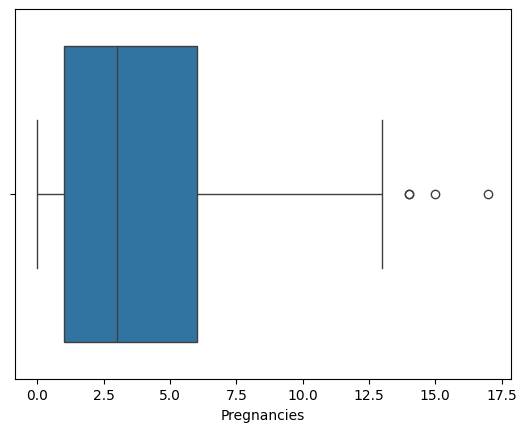

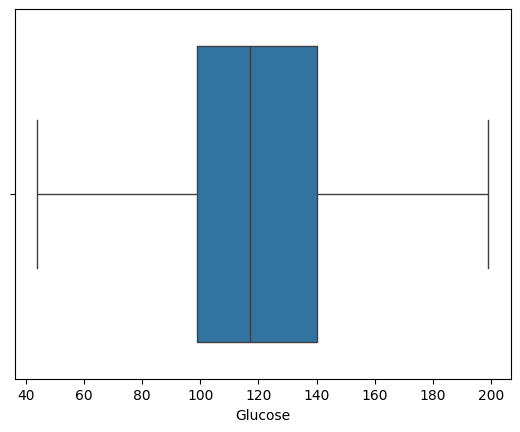

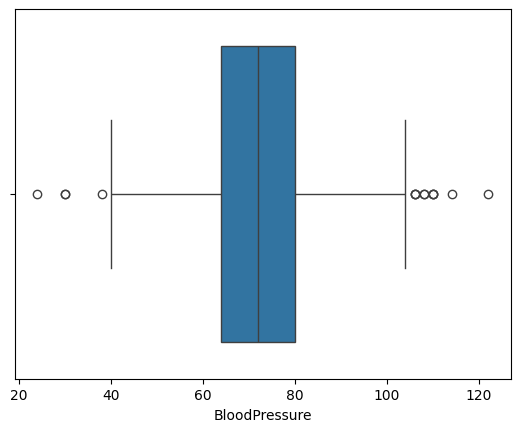

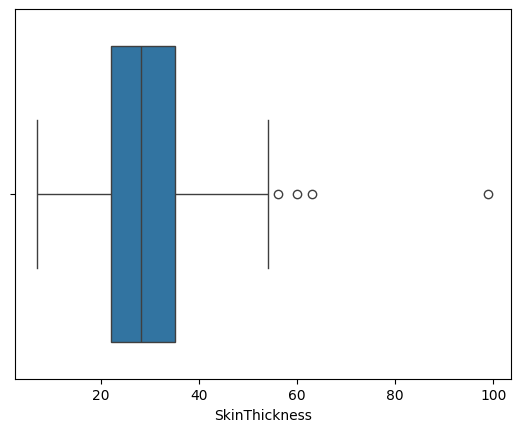

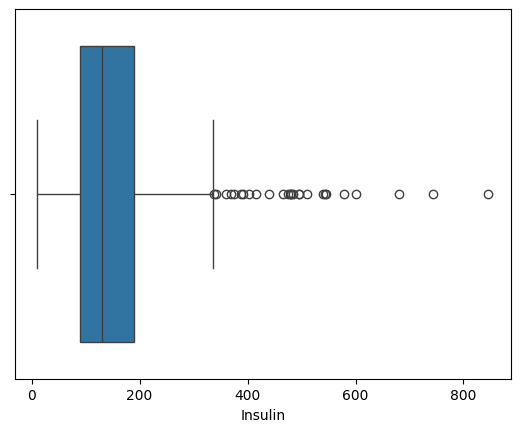

...

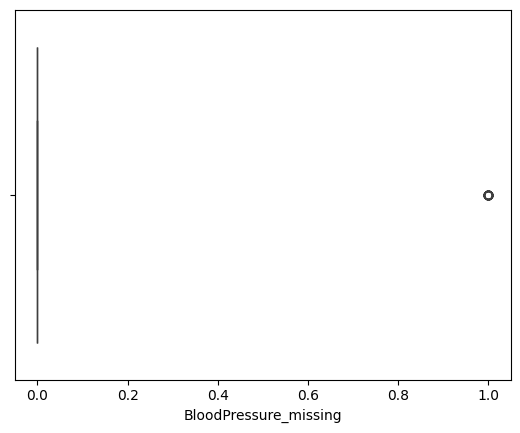

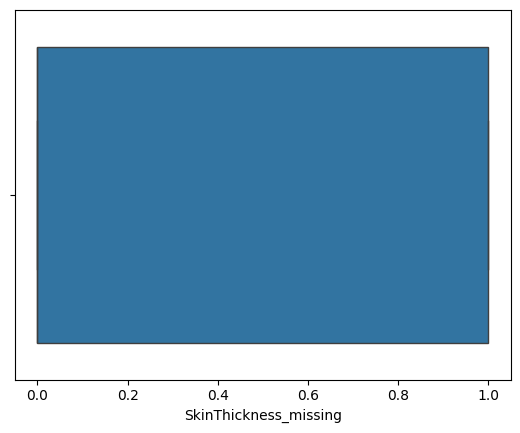

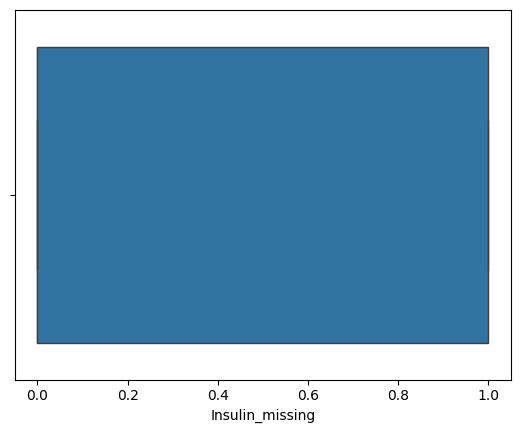

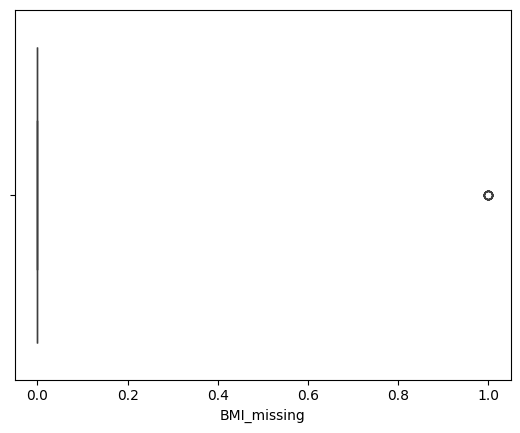

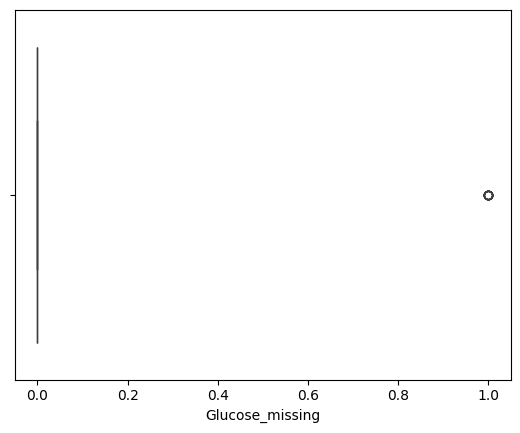

In [44]:
%matplotlib inline
for column in df: 
    sns.boxplot(x=df[column])
    plt.show()

##### **Insuline**

[![photo link](https://qph.cf2.quoracdn.net/main-qimg-0cc7f86972a32b2bd5f11ef82aa80ba3-lq)]


So we can consider that any record whith insuline > 300 is obviously not possible and an error. However the median for insulin is 125 so this threshold is too restrictive. To be sure to not delete relevant information, we will set the threshold to 700.

In [45]:
print(df[df['Insulin']>300])

     Pregnancies  Glucose  BloodPressure  SkinThickness     Insulin   BMI  \
8              2    197.0           70.0      45.000000  543.000000  30.5   
13             1    189.0           60.0      23.000000  846.000000  30.1   
22             7    196.0           90.0      37.794611  318.259155  39.8   
54             7    150.0           66.0      42.000000  342.000000  34.7   
56             7    187.0           68.0      39.000000  304.000000  37.7   
111            8    155.0           62.0      26.000000  495.000000  34.0   
139            5    105.0           72.0      29.000000  325.000000  36.9   
153            1    153.0           82.0      42.000000  485.000000  40.6   
154            8    188.0           78.0      45.040253  320.536586  47.9   
185            7    194.0           68.0      28.000000  315.756156  35.9   
186            8    181.0           68.0      36.000000  495.000000  30.1   
199            4    148.0           60.0      27.000000  318.000000  30.9   

In [46]:
df = df[df['Insulin'] <= 350]

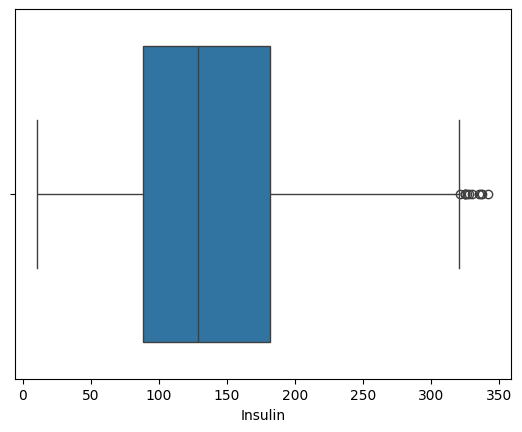

In [47]:
sns.boxplot(x=df['Insulin'])
plt.show()

##### **Skin Thickness**

*"The thickness of human skin ranges between 0.3 and 2.6 mm at various body sites"*  
https://link.springer.com/chapter/10.1007/978-981-99-2225-3_2#:~:text=2.2%20Structure%20of%20Skin&text=The%20epidermis%2C%20dermis%2C%20and%20hypodermis,of%202%20mm%20%5B9%5D.

Let analyse the outlier around 95mm

In [48]:
print(df[df['SkinThickness']>90])

     Pregnancies  Glucose  BloodPressure  SkinThickness     Insulin   BMI  \
579            2    197.0           70.0           99.0  336.446374  34.7   

     DiabetesPedigreeFunction  Age  Outcome  BloodPressure_missing  \
579                     0.575   62        1                      0   

     SkinThickness_missing  Insulin_missing  BMI_missing  Glucose_missing  
579                      0                1            0                0  


It is an outlier. So I take the decision to delete this record

In [49]:
df = df[df['SkinThickness'] <= 90]

##### **DiabetesPedigreeFunction**

*"The 'DiabetesPedigreeFunction' is a function that scores the probability of diabetes based on family history, with a realistic range of 0.08 to 2.42. "*  
https://dergipark.org.tr/en/download/article-file/1970853#:~:text=The%20'DiabetesPedigreeFunction'%20is%20a%20function,1%20represents%20those%20with%20diabetes.

In [50]:
print(df['DiabetesPedigreeFunction'].max())
print(df['DiabetesPedigreeFunction'].min())

2.42
0.078


→ No outlier

##### **Age, Glucose, BMI, Pregnancies, BloodPressure**

* Has extreme values but cannot be considered as outliers. So we will keep the records

### **Data Transformation**

* We will perform a ```log transform``` since our variables is right skewed
* We will perform a one hot encoded for categorical variables

In [51]:
# Log transormation on numerical variable
categorical_cols = ['Outcome', 'BloodPressure_missing', 'SkinThickness_missing', 'Insulin_missing', 'BMI_missing']

# Identifiez les colonnes numériques qui ne sont pas catégorielles
numeric_cols = df.select_dtypes(include=[np.number]).columns.difference(categorical_cols)

# Appliquez la transformation logarithmique sur les colonnes numériques uniquement
df_log = df.copy()
df_log[numeric_cols] = np.log(df[numeric_cols] + 1e-9)  # Ajouter une petite constante pour éviter le log de 0

# Vérifiez les résultats
print(df_log.head())

    Pregnancies   Glucose  BloodPressure  SkinThickness   Insulin       BMI  \
0  1.791759e+00  4.997212       4.276666       3.555348  5.358224  3.514526   
1  1.000000e-09  4.442651       4.189655       3.367296  4.195806  3.280911   
2  2.079442e+00  5.209486       4.158883       3.067425  5.609305  3.148453   
3  1.000000e-09  4.488636       4.189655       3.135494  4.543295  3.335770   
4 -2.072327e+01  4.919981       3.688879       3.555348  5.123964  3.763523   

   DiabetesPedigreeFunction       Age  Outcome  BloodPressure_missing  \
0                 -0.466809  3.912023        1                      0   
1                 -1.046969  3.433987        0                      0   
2                 -0.397497  3.465736        1                      0   
3                 -1.789761  3.044522        0                      0   
4                  0.827678  3.496508        1                      0   

   SkinThickness_missing  Insulin_missing  BMI_missing  Glucose_missing  
0           

In [52]:
skew = df_log.skew().sort_values(ascending=False)
print(skew)

BMI_missing                 8.045570
Glucose_missing             8.045570
BloodPressure_missing       4.280602
SkinThickness_missing       0.844025
Outcome                     0.678669
Age                         0.603367
DiabetesPedigreeFunction    0.095537
Insulin_missing            -0.010804
BMI                        -0.041509
Glucose                    -0.052948
SkinThickness              -0.676273
Insulin                    -0.768416
BloodPressure              -0.827318
Pregnancies                -1.975985
dtype: float64


* The log transformation improved the distribution  of ``Insulin``,``DiabetesPedigreeFunction``,``Age``,``BMI``

* However, it has degraded the distribution of ``Glucose``, ``Pregnancies``, ``SkinThickness``, ``Blood Pressure``

#### **New transformations**
* Log transform: ``Insulin``,``DiabetesPedigreeFunction``,``Age``,``BMI``
* Box Cox: ``Glucose`` , ``Blood Pressure``
* Z-score normalization : ``Pregnancies``, ``SkinThickness``

##### **Data Split**

In [53]:
from sklearn.model_selection import train_test_split

X = df.drop(columns=['Outcome'])
y = df['Outcome']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##### **Data Resampling**

**Class imbalance**

In [54]:
print(y.value_counts())

Outcome
0    490
1    252
Name: count, dtype: int64


The data are very unbalanced. We have about twice as many non-diabetics as diabetics. That's why we're going to resample the data.

In [55]:
#%pip install imblearn

In [56]:
from imblearn.over_sampling import SMOTE 
smote = SMOTE(random_state=42, k_neighbors=7, sampling_strategy=1)
X_train, y_train = smote.fit_resample(X_train, y_train)
X_train[X_train<= 0] = 1e-9  

In [58]:
print(y_train.value_counts())
skew = X_train.skew().sort_values(ascending=False)
print(skew)

Outcome
0    231
1    208
Name: count, dtype: int64
BMI_missing                 7.755073
Glucose_missing             7.755073
BloodPressure_missing       4.373597
DiabetesPedigreeFunction    1.635324
Age                         1.006042
SkinThickness_missing       0.860493
BMI                         0.782752
Pregnancies                 0.687669
Insulin                     0.589963
Glucose                     0.475609
SkinThickness               0.061627
BloodPressure               0.042562
Insulin_missing            -0.013715
dtype: float64


#### **Data transformation on X_train**

In [59]:
from scipy import stats
from sklearn.preprocessing import StandardScaler

# Log transformation 
X_train['DiabetesPedigreeFunction'] = np.log(X_train['DiabetesPedigreeFunction'])
X_train['Age'] = np.log(X_train['Age'])
X_train['BMI'] = np.log(X_train['BMI'])

# Box-Cox transformation
X_train['Insulin'], _  = stats.boxcox(X_train['Insulin'])
X_train['Glucose'], _ = stats.boxcox(X_train['Glucose'])
X_train['BloodPressure'], _ = stats.boxcox(X_train['BloodPressure'])


# Z-score normalization and scaling 
continuous_features = ['Pregnancies', 'SkinThickness', 'Insulin', 'Age', 'BMI', 'BloodPressure', 'Glucose']
scaler = StandardScaler()
X_train[continuous_features] = scaler.fit_transform(X_train[continuous_features])

#### **Data transformation on X_test**

In [60]:
# Log transformation 
X_test['DiabetesPedigreeFunction'] = np.log(X_test['DiabetesPedigreeFunction'])
X_test['Age'] = np.log(X_test['Age'])
X_test['BMI'] = np.log(X_test['BMI'])

# Box-Cox transformation
X_test['Insulin'], _  = stats.boxcox(X_test['Insulin'])
X_test['Glucose'], _ = stats.boxcox(X_test['Glucose'])
X_test['BloodPressure'], _ = stats.boxcox(X_test['BloodPressure'])

# Z-score normalization and scaling 
continuous_features = ['Pregnancies', 'SkinThickness', 'Insulin', 'Age', 'BMI', 'BloodPressure', 'Glucose']
scaler = StandardScaler()
X_test[continuous_features] = scaler.fit_transform(X_test[continuous_features])

In [61]:
skew = X_train.skew().sort_values(ascending=False)
print(skew)

BMI_missing                 7.755073
Glucose_missing             7.755073
BloodPressure_missing       4.373597
SkinThickness_missing       0.860493
Pregnancies                 0.687669
Age                         0.466129
DiabetesPedigreeFunction    0.106162
SkinThickness               0.061627
BloodPressure               0.044774
BMI                         0.026327
Glucose                    -0.001811
Insulin_missing            -0.013715
Insulin                    -0.024549
dtype: float64


=> **The features distribution is more "normal" than before** 

### One hot encoded 

No need since it is already binary and numerical !

Ref : https://stackoverflow.com/questions/43515877/should-binary-features-be-one-hot-encoded

## **2. Feature Selection:**  

- Perform feature selection or dimensionality reduction to improve model performance.

-----

We are going to perfom : 
* **Logistic Regression**, since some relations are linear (BMI vs Glucose, cf. profile report) and easy to perform 
* **MLP**, to capture more complex relations and non linear ones
* **Random Forest**, to capture more complex relations and non linear ones

----
* **Logistic Regression and MLP**, we will perform a Recursive Feature Elimination (RFE), L1-Lasso to capture the more important features
* **Random Forest**, no need 

### RFE

In [71]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

X_train_RFE = X_train.drop(columns=['BMI_missing','Glucose_missing','BloodPressure_missing','SkinThickness_missing','Insulin_missing'])

model = LogisticRegression(max_iter=1000)
rfe = RFE(model, n_features_to_select=5)
fit = rfe.fit(X_train_RFE, y_train)

# Check selected features
print(f"Selected Features: {fit.support_}")
print(f"Feature Ranking: {fit.ranking_}")

Selected Features: [False  True False False  True  True  True  True]
Feature Ranking: [2 1 3 4 1 1 1 1]


In [72]:
columns_to_keep =[]

for i in range(len(fit.ranking_)):
     
    if(fit.ranking_[i]==1):
        columns_to_keep.append(df.columns[i])

print(columns_to_keep)


for column in columns_to_keep:
    col_name = column + '_missing'
    if col_name in df.columns:
        columns_to_keep.append(col_name)

print(columns_to_keep)
X_train_RFE = X_train[columns_to_keep]
X_test_RFE = X_test[columns_to_keep]


['Glucose', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']
['Glucose', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', 'Glucose_missing', 'Insulin_missing', 'BMI_missing']


#### L1 Lasso

In [73]:
from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
y_pred = lasso.predict(X_test)

from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

coefficients = lasso.coef_

features = X.columns
coef_df = pd.DataFrame({'Feature': features, 'Coefficient': coefficients})
print(coef_df[coef_df['Coefficient'] != 0])


Mean Squared Error: 0.19487693014205248
R^2 Score: 0.06353620647538805
   Feature  Coefficient
1  Glucose     0.117684
4  Insulin     0.030285
5      BMI     0.033348
7      Age     0.012537


In [74]:
columns_to_keep =[]

for i in range(len(coef_df['Feature'])):
     
    if(coef_df['Coefficient'][i]!=0):
        columns_to_keep.append(coef_df['Feature'][i])

print(columns_to_keep)


for column in columns_to_keep:
    col_name = column + '_missing'
    if col_name in df.columns:
        columns_to_keep.append(col_name)

print(columns_to_keep)
X_train_LASSO= X_train[columns_to_keep]
X_test_LASSO = X_test[columns_to_keep]

['Glucose', 'Insulin', 'BMI', 'Age']
['Glucose', 'Insulin', 'BMI', 'Age', 'Glucose_missing', 'Insulin_missing', 'BMI_missing']


## **3. Model Selection:**  

- Experiment with at least three different machine learning algorithms (e.g., Decision Trees, Neural Networks, LR, …).

- Justify your choice of algorithms based on theoretical knowledge and the characteristics of the dataset.

---

We are going to perfom : 
* **Logistic Regression**, since some relations are linear (BMI vs Glucose, cf. profile report) and easy to perform 
* **MLP**, to capture more complex relations and non linear ones
* **Random Forest**, to capture more complex relations and non linear ones

### **LOGISTIC REGRESSION**

#### Feature Reduction RFE

In [75]:
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay

              precision    recall  f1-score   support

           0       0.91      0.67      0.77       105
           1       0.51      0.84      0.64        44

    accuracy                           0.72       149
   macro avg       0.71      0.75      0.70       149
weighted avg       0.79      0.72      0.73       149



<Figure size 2000x1000 with 0 Axes>

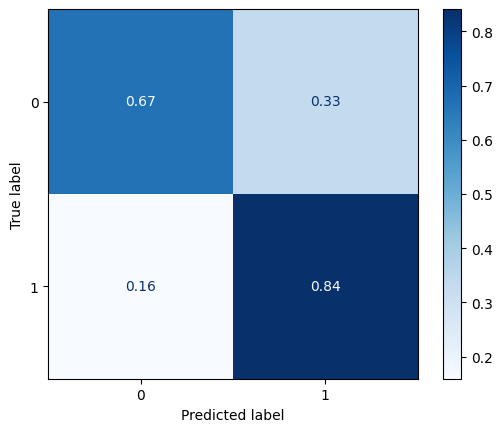

<Figure size 2000x1000 with 0 Axes>

In [76]:
log_reg_RFE= LogisticRegression()
log_reg_RFE.fit(X_train_RFE, y_train)

y_pred_log_reg = log_reg_RFE.predict(X_test_RFE)


print(classification_report(y_test, y_pred_log_reg))


ConfusionMatrixDisplay.from_estimator(log_reg_RFE, X_test_RFE, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

#### Feature Reduction LASSO

              precision    recall  f1-score   support

           0       0.91      0.70      0.80       105
           1       0.54      0.84      0.66        44

    accuracy                           0.74       149
   macro avg       0.73      0.77      0.73       149
weighted avg       0.80      0.74      0.76       149



<Figure size 2000x1000 with 0 Axes>

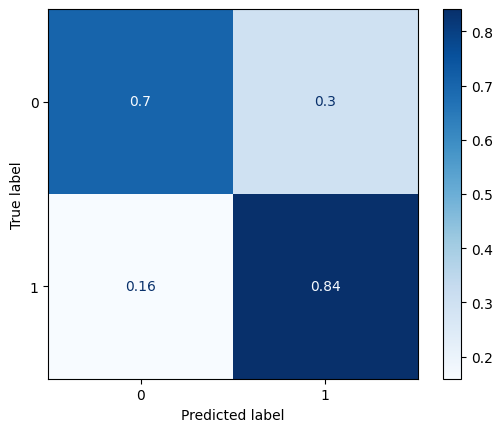

<Figure size 2000x1000 with 0 Axes>

In [77]:
log_reg_LASSO= LogisticRegression()
log_reg_LASSO.fit(X_train_LASSO, y_train)

y_pred_log_reg_LASSO = log_reg_LASSO.predict(X_test_LASSO)



print(classification_report(y_test, y_pred_log_reg_LASSO))


ConfusionMatrixDisplay.from_estimator(log_reg_LASSO, X_test_LASSO, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

#### NO Feature Reduction (BEST)

              precision    recall  f1-score   support

           0       0.94      0.71      0.81       105
           1       0.57      0.89      0.69        44

    accuracy                           0.77       149
   macro avg       0.75      0.80      0.75       149
weighted avg       0.83      0.77      0.78       149



<Figure size 2000x1000 with 0 Axes>

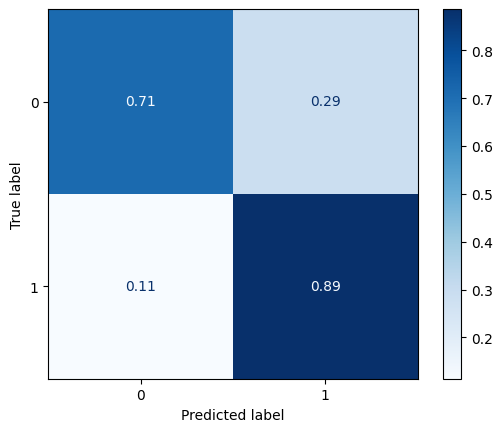

<Figure size 2000x1000 with 0 Axes>

In [78]:
log_reg= LogisticRegression()
log_reg.fit(X_train, y_train)

y_pred_log_reg = log_reg.predict(X_test)



print(classification_report(y_test, y_pred_log_reg))


ConfusionMatrixDisplay.from_estimator(log_reg, X_test, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

### **MLP**

#### NO Feature Reduction

Classification Report (MLP Classifier):
               precision    recall  f1-score   support

           0       0.86      0.72      0.79       105
           1       0.52      0.73      0.61        44

    accuracy                           0.72       149
   macro avg       0.69      0.73      0.70       149
weighted avg       0.76      0.72      0.73       149



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


<Figure size 2000x1000 with 0 Axes>

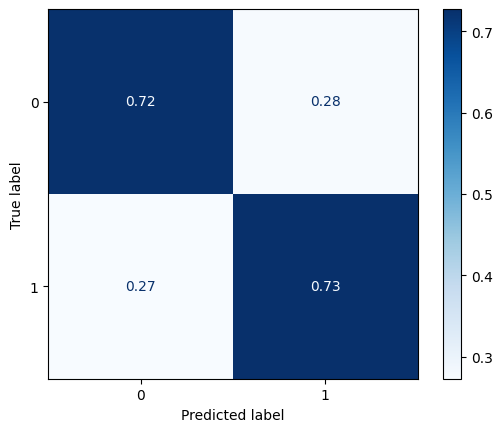

<Figure size 2000x1000 with 0 Axes>

In [79]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128, 64), activation='relu', solver='adam',
max_iter=200, random_state=42)

mlp.fit(X_train, y_train) # Using integer-encoded labels for training

y_pred_mlp = mlp.predict(X_test)

print('Classification Report (MLP Classifier):\n',
classification_report(y_test, y_pred_mlp))

ConfusionMatrixDisplay.from_estimator(mlp, X_test, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

#### MLP RFE

Classification Report (MLP Classifier):
               precision    recall  f1-score   support

           0       0.89      0.70      0.79       105
           1       0.53      0.80      0.64        44

    accuracy                           0.73       149
   macro avg       0.71      0.75      0.71       149
weighted avg       0.78      0.73      0.74       149



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


<Figure size 2000x1000 with 0 Axes>

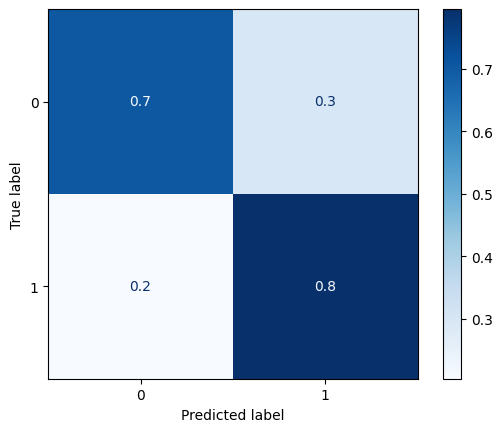

<Figure size 2000x1000 with 0 Axes>

In [80]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128, 64), activation='relu', solver='adam',
max_iter=200, random_state=42)

mlp.fit(X_train_RFE, y_train) # Using integer-encoded labels for training

y_pred_mlp = mlp.predict(X_test_RFE)

print('Classification Report (MLP Classifier):\n',
classification_report(y_test, y_pred_mlp))

ConfusionMatrixDisplay.from_estimator(mlp, X_test_RFE, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

#### MLP LASSO

Classification Report (MLP Classifier):
               precision    recall  f1-score   support

           0       0.89      0.70      0.78       105
           1       0.52      0.80      0.63        44

    accuracy                           0.72       149
   macro avg       0.71      0.75      0.71       149
weighted avg       0.78      0.72      0.74       149



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


<Figure size 2000x1000 with 0 Axes>

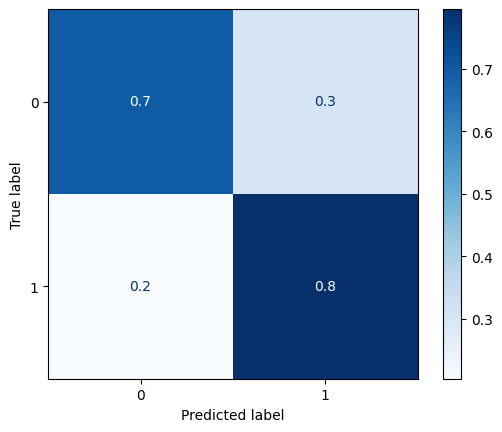

<Figure size 2000x1000 with 0 Axes>

In [81]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(128, 64), activation='relu', solver='adam',
max_iter=200, random_state=42)

mlp.fit(X_train_LASSO, y_train) # Using integer-encoded labels for training

y_pred_mlp = mlp.predict(X_test_LASSO)

print('Classification Report (MLP Classifier):\n',
classification_report(y_test, y_pred_mlp))

ConfusionMatrixDisplay.from_estimator(mlp, X_test_LASSO, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

### **Random Forest**

              precision    recall  f1-score   support

           0       0.91      0.70      0.79       105
           1       0.54      0.84      0.65        44

    accuracy                           0.74       149
   macro avg       0.72      0.77      0.72       149
weighted avg       0.80      0.74      0.75       149



<Figure size 2000x1000 with 0 Axes>

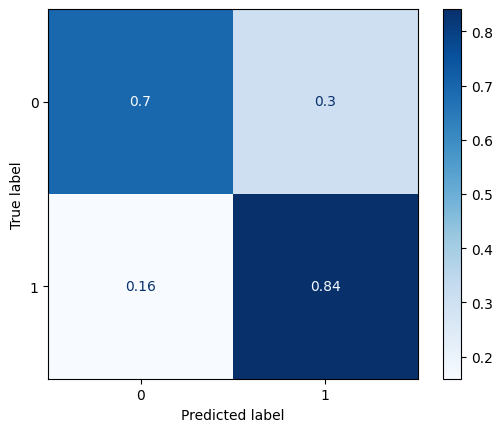

<Figure size 2000x1000 with 0 Axes>

In [82]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, oob_score=True, random_state=42)

rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

print(classification_report(y_test, y_pred_rf))

ConfusionMatrixDisplay.from_estimator(rf, X_test, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

#### Feedback: 
Before Data resampling (SMOTE) :
* Precision : 0.72
* Recall : 0.72
* f1 socre : 0.72
* accuracy : 0.77
* FN: 0.36
* FP: 0.2

##### **=> We have too much False Negative (FN). Since we are dealing with sensitive data such as diabetes, this rate must me reduced as much as possible. FN can leads to misdiagnostis and possibly <span> death. </span>**

After Data resampling (SMOTE) :
* Precision : 0.69
* Recall : 0.71
* f1 socre : 0.69
* accuracy : 0.72
* FN: 0.27
* FP: 0.3
##### **=> Thanks to data resampling, we succeded to reduce the part of FN which is good. However we increased a lot the FP rate (0.3), but it is not serious since it exposes less health risks**
https://medium.com/@Sanskriti.Singh/an-emphasis-on-the-minimization-of-false-negatives-false-positives-in-binary-classification-9c22f3f9f73


## **4. Model Evaluation:**



- Evaluate the performance of your models using metrics such as accuracy, precision, recall, F1-score, and confusion matrix.

- Compare the performance of different models and provide a comprehensive analysis.

| Model                        | Feature Reduction | Precision | Recall| F1-Score | Accuracy | FPR  | FNR  |
|------------------------------|-------------------|-----------|-----------------|----------|----------|------|---------|
| Logistic Regression           | RFE               | 0.71      | 0.75 | 0.70     | 0.72     | 0.33 | 0.16    |
| Logistic Regression           | Lasso             | 0.73      | 0.77</span>   | 0.70     | 0.74     | 0.30 | 0.16    |
| Logistic Regression           | None              | 0.75      | <span style="color: green;">0.80</span>   | 0.75     | 0.77     | 0.29 | <span style="color: red;">0.11</span> |
| MLP                          | None              | 0.69      | 0.73           | 0.70     | 0.72     | 0.27 | <span style="color: red;">0.28</span> |
| MLP                          | RFE               | 0.71      | <span style="color: green;">0.75</span>   | 0.71     | 0.73     | 0.30 | <span style="color: red;">0.20</span> |
| MLP                          | Lasso             | 0.71      | <span style="color: green;">0.75</span>   | 0.71     | 0.72     | 0.30 | <span style="color: red;">0.20</span> |
| Random Forest                | None              | 0.72      | <span style="color: green;">0.77</span>   | 0.74     | 0.72     | 0.30 | 0.16    |


For this dataset we need to focus on ``recall`` and ``FNR`` since misdiagnosis can be really dangereous for people. We are less concern about precision and Accuracy. However ``F1-SCORE`` could be interesting to follow since it measures a good balance between RECALL and PRECISION. 

We will now focus on hyperparameter tuning for both Logistic Regression with no feature reduction and Random Forest with no feature reduction to enhance the performance 

## **5. Hyperparameter Tuning:**

- Use techniques like Grid Search or Random Search to optimize the hyperparameters of your chosen models.



### Grid Search Smote

### Grid Search Random Forest

In [63]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, recall_score,classification_report

# Créer le modèle de Random Forest
rf = RandomForestClassifier(random_state=42)


# Définir la grille des paramètres à explorer pour SMOTE et Random Forest
param_grid = {
    'n_estimators': [150, 200,250,300,350],
    'max_depth': [None,5,7,10,12,14,16],
    #'rf__min_samples_split': [2, 5, 10],
    #'min_samples_leaf': [2,5,7,9],
    'criterion': ['gini', 'entropy','log_loss'],
    'max_features': ['sqrt', 'log2', None],
    #'max_leaf_nodes': [None, 10, 20, 30],
    'bootstrap': [True],
    #'ccp_alpha': [0.0, 0.01, 0.1]
    #'class_weight': ['balanced', None],
    'oob_score':[True],
}

# Créer un scoreur pour le recall
scorer = make_scorer(recall_score)

# Créer la recherche de grille pour le pipeline
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring=scorer,
    cv=5,
    return_train_score=True,
    n_jobs=-1
)

# Ajuster le modèle et obtenir les meilleurs paramètres
grid_search.fit(X_train, y_train)

# Afficher les meilleurs paramètres trouvés
print("Meilleurs paramètres trouvés :")
print(grid_search.best_params_)

# Prédire sur le jeu de test avec le meilleur modèle
y_pred = grid_search.predict(X_test)

# Afficher le rapport de classification
print(classification_report(y_test, y_pred))

#Meilleurs paramètres trouvés :
#{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'n_estimators': 200, 'oob_score': True}

#best : 
#'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'n_estimators': 200, 'oob_score': True}

# Best without adding column missing 
#{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 150, 'oob_score': True}
# recall 0.71
# precision 0.68
# accuracy 0.70

# Best with SMOTE 
#{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 5, 'max_features': None, 'n_estimators': 300, 'oob_score': True}
#recall 0.67
# precision 0.64
# accuracy 0.63

# Best with SMOTE and missing col
#{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 7, 'max_features': 'sqrt', 'n_estimators': 250, 'oob_score': True}
#recall 0.68
# precision 0.65
# accuracy 0.64


# Best with SMOTE and missing col
#{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 7, 'max_features': 'sqrt', 'n_estimators': 250, 'oob_score': True}
#recall 0.68
# precision 0.65
# accuracy 0.64





Meilleurs paramètres trouvés :
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt', 'n_estimators': 200, 'oob_score': True}
              precision    recall  f1-score   support

           0       0.91      0.71      0.80       105
           1       0.55      0.84      0.67        44

    accuracy                           0.75       149
   macro avg       0.73      0.78      0.73       149
weighted avg       0.81      0.75      0.76       149



              precision    recall  f1-score   support

           0       0.93      0.68      0.78       105
           1       0.53      0.89      0.67        44

    accuracy                           0.74       149
   macro avg       0.73      0.78      0.73       149
weighted avg       0.82      0.74      0.75       149



<Figure size 2000x1000 with 0 Axes>

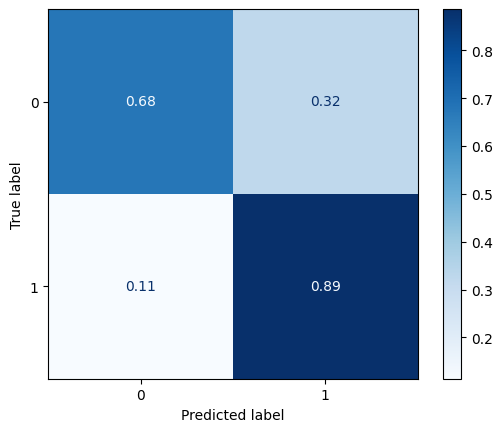

<Figure size 2000x1000 with 0 Axes>

In [89]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay

rf = RandomForestClassifier(n_estimators=180, oob_score=True, random_state=42, bootstrap=True, criterion = 'gini', max_depth = 7, max_features= 'sqrt')

rf.fit(X_train, y_train)

y_pred_rf = rf.predict(X_test)

print(classification_report(y_test, y_pred_rf))

ConfusionMatrixDisplay.from_estimator(rf, X_test, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

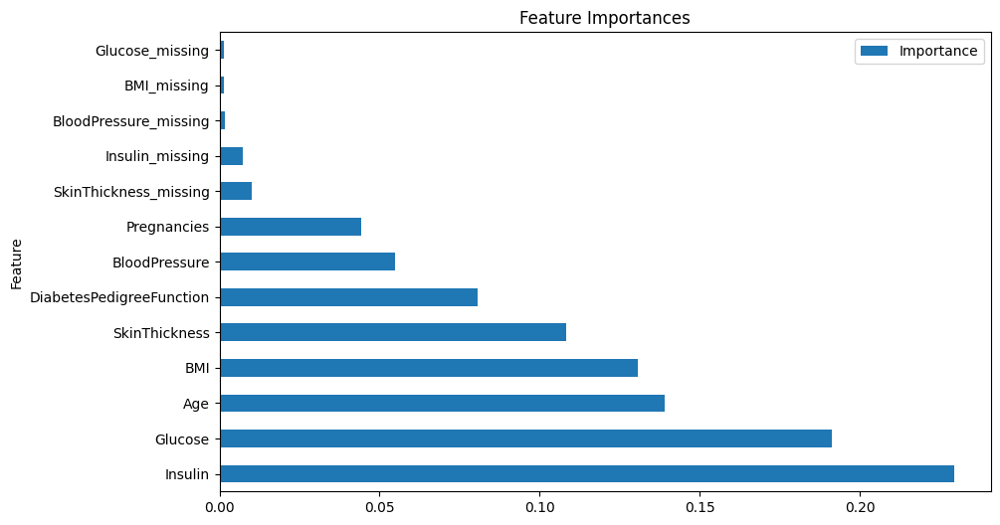

In [91]:
features = pd.DataFrame({'Feature': X_train.columns, 'Importance': rf.feature_importances_})
features = features.sort_values(by='Importance', ascending=False)

features.plot(kind='barh', x='Feature', y='Importance', title="Feature Importances", figsize=(10, 6))
plt.show()

### Grid Search Logistic

In [62]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, recall_score, classification_report

# Créer le modèle de régression logistique
log_reg = LogisticRegression(max_iter=1000)

# Définir la grille des paramètres à explorer
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['lbfgs','liblinear', 'saga', 'newton-cholesky'],
    'class_weight': [None, 'balanced'],
    'max_iter': [100, 200, 500],
    'random_state': [None,42]
}

# Créer un scoreur pour le recall
scorer = make_scorer(recall_score,average='macro')

# Créer la recherche de grille pour le pipeline
grid_search = GridSearchCV(
    estimator=log_reg,
    param_grid=param_grid,
    scoring=scorer,
    cv=5,
    return_train_score=True,
    n_jobs=-1
)

# Ajuster le modèle avec les données d'entraînement
grid_search.fit(X_train, y_train)

best_param=grid_search.best_params_

# Afficher les meilleurs paramètres et le meilleur score
print("Meilleurs paramètres :", grid_search.best_params_)
print("Meilleur score de rappel :", grid_search.best_score_)

# Prédictions sur les données de test
y_pred = grid_search.predict(X_test)

# Afficher le rapport de classification
print(classification_report(y_test, y_pred))



Meilleurs paramètres : {'C': 0.1, 'class_weight': 'balanced', 'max_iter': 100, 'random_state': None, 'solver': 'saga'}
Meilleur score de rappel : 0.7397738468596528
              precision    recall  f1-score   support

           0       0.92      0.65      0.76       105
           1       0.51      0.86      0.64        44

    accuracy                           0.71       149
   macro avg       0.71      0.76      0.70       149
weighted avg       0.80      0.71      0.72       149



              precision    recall  f1-score   support

           0       0.94      0.71      0.81       105
           1       0.57      0.89      0.69        44

    accuracy                           0.77       149
   macro avg       0.75      0.80      0.75       149
weighted avg       0.83      0.77      0.78       149



<Figure size 2000x1000 with 0 Axes>

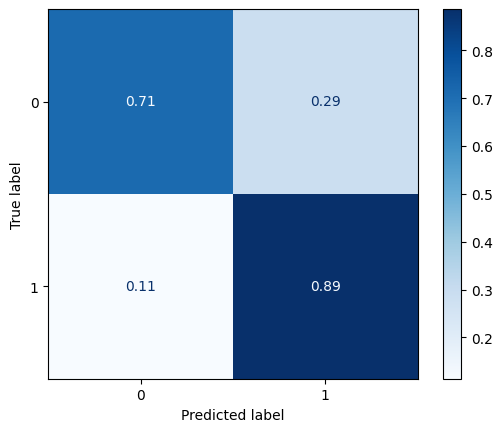

<Figure size 2000x1000 with 0 Axes>

In [86]:
log_reg= LogisticRegression(**best_param)
log_reg.fit(X_train, y_train)

y_pred_log_reg = log_reg.predict(X_test)



print(classification_report(y_test, y_pred_log_reg))


ConfusionMatrixDisplay.from_estimator(log_reg, X_test, y_test, cmap=plt.cm.Blues, normalize='true')
plt.figure(figsize=(20, 10))

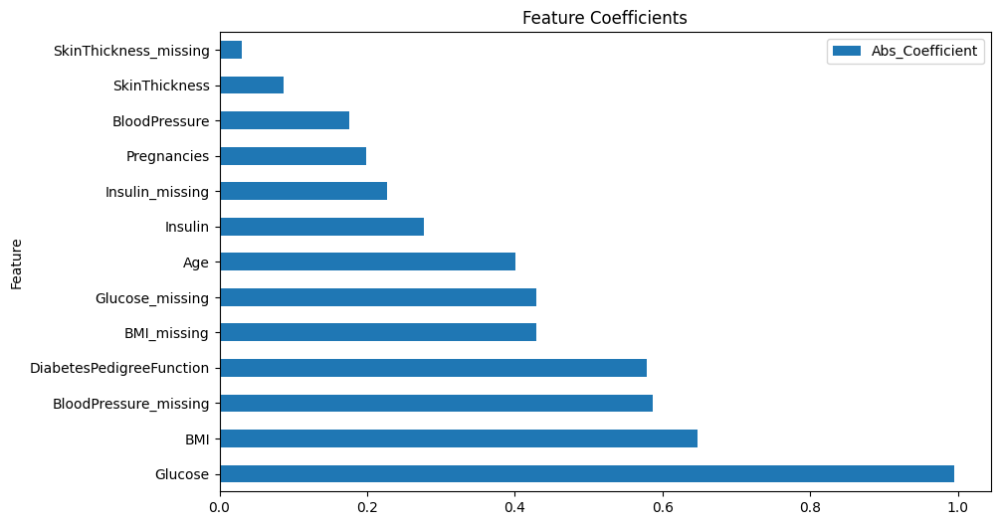

In [88]:
coefficients = log_reg.coef_[0] 
features = pd.DataFrame({'Feature': X_train.columns, 'Coefficient': coefficients})

features['Abs_Coefficient'] = np.abs(features['Coefficient'])
features = features.sort_values(by='Abs_Coefficient', ascending=False)

features.plot(kind='barh', x='Feature', y='Abs_Coefficient', title="Feature Coefficients", figsize=(10, 6))
plt.show()


#### Final Conclusion:

| Model After Hypertuning                       | Feature Reduction | Precision | Recall| F1-Score | Accuracy | FPR  | FNR  |
|------------------------------|-------------------|-----------|-----------------|----------|----------|------|---------|
| Random Forest                | None              | 0.73      | 0.78   | 0.73     | 0.74     | 0.32 | 0.11    |
| <span style="color: green;">Logistic Regression           | None              |<span style="color: green;"> 0.75      |<span style="color: green;"> 0.80 | <span style="color: green;">0.75     | <span style="color: green;">0.77     | <span style="color: green;">0.29 | <span style="color: green;">0.11    |

----
The column ``_missing``, the one I've added, had a significant impact with logistic regression and no impact with random forest. 

Top 4 features importance:

* Random forest : insulin, glucose, age, BMI
* Log regression :  glucose, BMI, Blood_pressure_missing, diabetepedigreefunction

---------
The model demonstrates a ```Precision``` of 0.75, indicating that when it predicts a class, it is correct 73% of the time. However, the precision for positive case is only 57% which means that the model made only 57% of correct preciction for real diabete person (we have a lot of false positive).

The ``Recall`` score of 0.80 reveals that the model is successful in identifying 80% of the actual cases (89% for positive case). This is a strong recall rate, indicating that the model is effective in capturing most of the true positives, **which is particularly important in scenarios where missing positive cases can have significant consequences.**

With an ``F1-Score`` of 0.75, the model balances precision and recall well. The F1-Score is particularly useful in situations with imbalanced classes, showing that the model maintains a fair trade-off between the two metrics.

The overall ``Accuracy`` of 0.77 reflects that the model correctly classifies 74% of all instances.

<span style='background :purple' >  The ```False Negative Rate``` of 0.11 indicates that 11% of the actual positive cases are being incorrectly classified as negative. Lowering this rate is <span style='background :red' > important </span>to reduce the risk of overlooking important positive instances. </span>

Lastly, the ``False Positive Rate`` of 0.29 shows that 29% of the negative cases are incorrectly identified as positive. This relatively high rate suggests that there may be a need for further adjustments to improve the model's specificity and reduce unnecessary false alarms.

#### **In summary, the model shows a good balance between precision and recall, with opportunities for enhancement in false positive classifications to increase overall effectiveness.**

#### **This model can be very good for detecting diabete. If the test is ``non-diabete`` the precision is 94%, so it is good. If the test is ``diabete``, the hospital needs to run other test to confirm this statement**


## **6. Report:**  

### Note: Sir GHASSANY told us that a simple notebook in both .ipynb and .pdf extention is enough. I tried to explain as much as possible each line of code to show you that everything has been thought.